# Poisonous Mushrooms or Not Poisonous Mushrooms

In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow 
import os
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
from tensorflow.python import keras
from keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
import tensorflow as tf

# IMPORT DATASETS

In [120]:
train_path = '/Users/sophie/Desktop/test_image/Training'
valid_path = '/Users/sophie/Desktop/test_image/Validation'
test_path = '/Users/sophie/Desktop/test_image/Test'

image_gen = ImageDataGenerator() # create a data generator rescale= 1. /255

train_batches = image_gen.flow_from_directory(
    train_path,
    classes=['poisonous', 'non_poisonous'],
    target_size=(224, 224),
    batch_size=80 # change this to a smaller number for plotting such as 20
)
validation_batches = image_gen.flow_from_directory(
    valid_path,
    classes=['poisonous', 'non_poisonous'],
    target_size=(224, 224),
    batch_size=17 # change this to a smaller number when plotting also around 20 for visibility 
)

test_batches = image_gen.flow_from_directory(
    test_path,
    classes=['poisonous', 'non_poisonous'],
    target_size=(224, 224),
    batch_size=17 # change this to a lower number for plotting 
)


Found 962 images belonging to 2 classes.
Found 206 images belonging to 2 classes.
Found 206 images belonging to 2 classes.


# DATA VISUALIZATION

In [104]:
# plots images with labels within Jupyter Notebook
def plots(ims, figsize=(50,20), rows=5, interp=False, titles=None):
    if type(ims[0]) is np.ndarray:
        ims = np.array(ims).astype(np.uint8)
        if(ims.shape[-1] !=3):
            ims = ims.transpose((0, 2, 3, 1))
    f = plt.figure(figsize=figsize)
    cols = len(ims)//rows if len(ims) % 2 == 0 else len(ims)//rows + 1
    for i in range(len(ims)):
        sp = f.add_subplot(rows, cols, i+1)
        sp.axis('Off')
        if titles is not None: 
            sp.set_title(titles[i], fontsize=16)
        plt.imshow(ims[i], interpolation=None if interp else 'none')

# will reference 

In [105]:
ims, labels = next(train_batches)

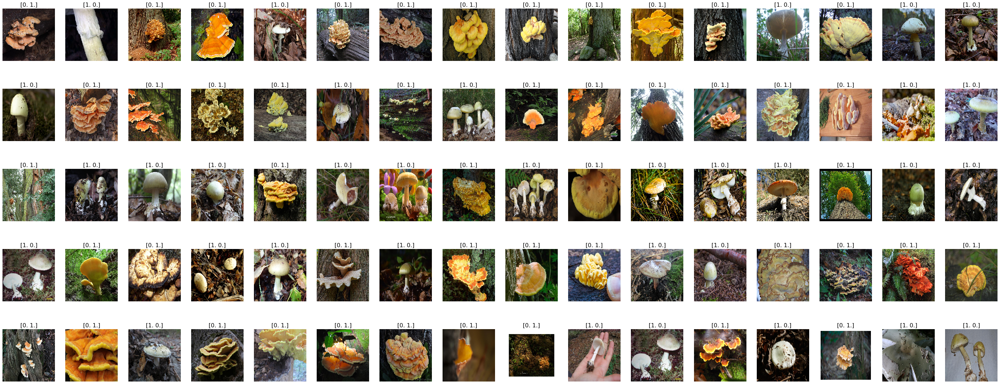

In [106]:
plots(ims, titles=labels)

# CNN MODEL TRAINING

In [121]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, Dense, Flatten, Dropout
from keras.optimizers import Adam
from keras.callbacks import TensorBoard

In [140]:
cnn_model = Sequential()

cnn_model.add(Conv2D(filters=16, kernel_size=(3, 3), activation='relu', input_shape=(224, 224, 3)))
cnn_model.add(AveragePooling2D())
cnn_model.add(Dropout(0.3))

cnn_model.add(Conv2D(filters=8, kernel_size=(3, 3), activation='relu'))
cnn_model.add(AveragePooling2D())
cnn_model.add(Dropout(0.3))

cnn_model.add(Flatten())

cnn_model.add(Dense(units=32, activation='relu'))

cnn_model.add(Dense(units=16, activation='relu'))

cnn_model.add(Dense(units=2, activation = 'softmax'))

cnn_model.summary()

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_26 (Conv2D)           (None, 222, 222, 16)      448       
_________________________________________________________________
average_pooling2d_26 (Averag (None, 111, 111, 16)      0         
_________________________________________________________________
dropout_26 (Dropout)         (None, 111, 111, 16)      0         
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 109, 109, 8)       1160      
_________________________________________________________________
average_pooling2d_27 (Averag (None, 54, 54, 8)         0         
_________________________________________________________________
dropout_27 (Dropout)         (None, 54, 54, 8)         0         
_________________________________________________________________
flatten_13 (Flatten)         (None, 23328)           

In [141]:
cnn_model.compile(loss ='binary_crossentropy', optimizer=Adam(lr=0.0001),metrics =['accuracy'])

In [142]:
print(y_test)

[[1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]]


In [143]:
history = cnn_model.fit_generator(train_batches,
                        steps_per_epoch=10,
                        validation_data = validation_batches,
                        validation_steps=10,
                        epochs=1,
                        verbose=1)

Epoch 1/1
10/10 [==============================] - 20s 2s/step - loss: 7.0611 - accuracy: 0.5748 - val_loss: 5.9677 - val_accuracy: 0.5471


# CNN MODEL EVALUATION

In [118]:
X_test, y_test = next(test_batches)

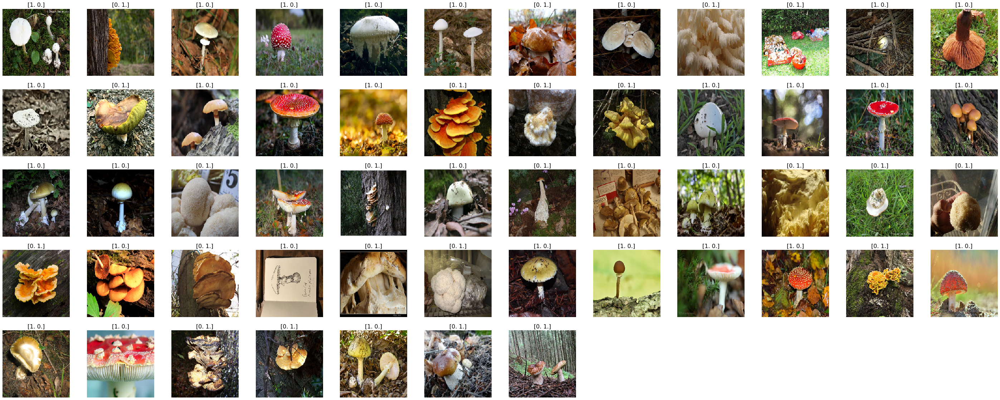

In [54]:
plots(X_test, titles=y_test)

In [39]:
score = cnn_model.evaluate(X_test, y_test,verbose=0)

In [40]:
print('Test Accuracy : {:.4f}'.format(score[1]))

Test Accuracy : 0.4828


In [42]:
y_predict= cnn_model.predict_generator(test_batches, steps=1, verbose=0)
y_predict

array([[1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.],
       [1., 0.]], dtype=float32

In [44]:
from sklearn.metrics import confusion_matrix
results2 = confusion_matrix(y_test[:,0], y_predict[:,0])
print(results2)

[[ 0 30]
 [ 0 28]]


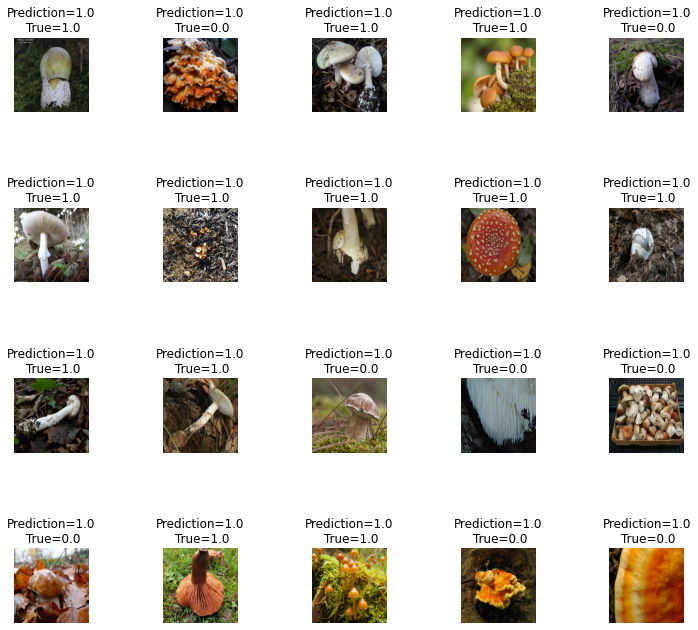

In [45]:
L = 4
W = 5
fig, axes = plt.subplots(L, W, figsize=(12,12))
axes = axes.ravel() # 

for i in np.arange(0, L * W):  
    axes[i].imshow(X_test[i].astype('uint8'))
    axes[i].set_title("Prediction={}\n True={}".format(y_predict[:,0][i], y_test[:,0][i]))
    axes[i].axis('off')

plt.subplots_adjust(wspace=1)
# will reference 

# CNN EVALUATION VISUALIZATION

In [55]:
history.history.keys()

dict_keys(['val_loss', 'val_accuracy', 'loss', 'accuracy'])

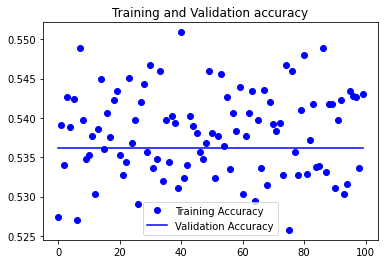

In [56]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))

plt.plot(epochs, accuracy, 'bo', label='Training Accuracy')
plt.plot(epochs, val_accuracy, 'b', label='Validation Accuracy')
plt.title('Training and Validation accuracy')
plt.legend()

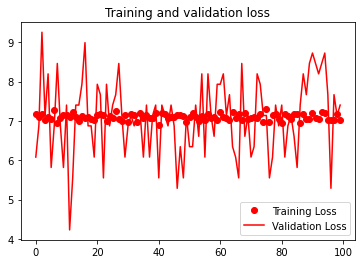

In [57]:
plt.plot(epochs, loss, 'ro', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

# Threshold

run logistic regression 

logit with predict_proba with X_test 

In [ ]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score